In [1]:
import plotly.express as px
from sklearn.decomposition import PCA
import zlib, json
from base64 import b64encode, b64decode
import pandas as pd

In [2]:
# df = px.data.iris()

In [3]:
pca_data = {}
raw_data = []

In [4]:
path = r"T:\\T\\NetAgnosticsv2\\src\\data\\nocona_2023-04-13-2023-04-14.json"

In [5]:
key_factors = ['Fan.Embedded.1A', 'Fan.Embedded.2A', 'Fan.Embedded.3A', 'Fan.Embedded.4A', 'Fan.Embedded.1B', 'Fan.Embedded.2B', 'Fan.Embedded.3B', 'Fan.Embedded.4B', 'MemoryPowerMetrics', 'SystemPowerMetrics', 'iDRAC.Embedded.1#CPU1Temp', 'iDRAC.Embedded.1#CPU2Temp', 'iDRAC.Embedded.1#InletTemp', 'memoryusage', 'memory_used', 'cpu_load', 'job_id', 'cores']

In [6]:
def compress_json(data):
    return {'base64(zip(o))': b64encode(zlib.compress(json.dumps(data).encode('utf-8'))).decode()}

def decompress_json(data):
    compressed_json =  data['base64(zip(o))']
    return json.loads(zlib.decompress(b64decode(compressed_json)))

{'nodes': ['cpu-24-55', 'cpu-26-6', 'cpu-24-30', 'cpu-24-28', 'cpu-26-48', 'cpu-25-41', 'cpu-26-31', 'cpu-24-21', 'cpu-24-39', 'cpu-24-50', 'cpu-26-45', 'cpu-23-42', 'cpu-23-20', 'cpu-24-45', 'cpu-23-52', 'cpu-23-15', 'cpu-26-53', 'cpu-26-13', 'cpu-25-5', 'cpu-26-14', 'cpu-26-24', 'cpu-24-31', 'cpu-25-24', 'cpu-24-33', 'cpu-26-37', 'cpu-25-42', 'cpu-23-36', 'cpu-23-35', 'cpu-23-9', 'cpu-23-5', 'cpu-26-26', 'cpu-23-51', 'cpu-23-46', 'cpu-26-27', 'cpu-23-31', 'cpu-24-34', 'cpu-25-23', 'cpu-26-30', 'cpu-24-27', 'cpu-25-31', 'cpu-23-37', 'cpu-24-20', 'cpu-24-59', 'cpu-24-22', 'cpu-26-29', 'cpu-25-28', 'cpu-25-11', 'cpu-24-46', 'cpu-25-57', 'cpu-24-5', 'cpu-26-32', 'cpu-26-28', 'cpu-24-13', 'cpu-23-55', 'cpu-25-47', 'cpu-24-15', 'cpu-25-16', 'cpu-23-21', 'cpu-23-33', 'cpu-26-44', 'cpu-25-18', 'cpu-24-10', 'cpu-25-53', 'cpu-24-48', 'cpu-25-50', 'cpu-25-40', 'cpu-24-14', 'cpu-23-38', 'cpu-25-8', 'cpu-25-49', 'cpu-23-3', 'cpu-26-34', 'cpu-26-60', 'cpu-23-28', 'cpu-26-1', 'cpu-24-3', 'cpu-26-38

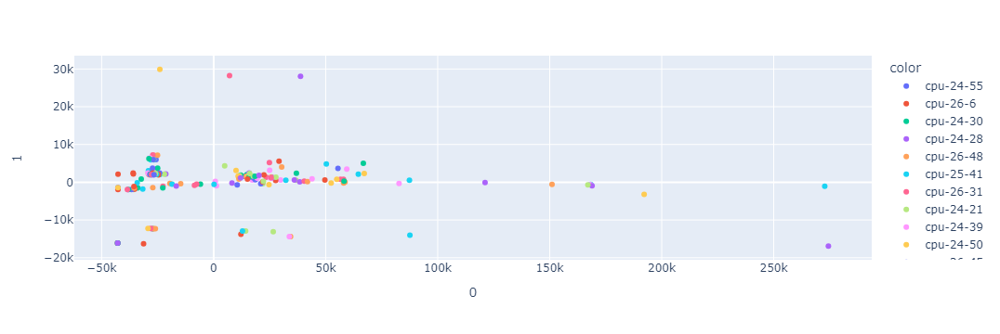

In [22]:


with open(path, "r") as f:
    data = f.read()
    decompressed_json = decompress_json(json.loads(data))
    # print(decompressed_json)
    # for key, value in decompressed_json.items():
    #     print(key, len(value))
    # print(decompressed_json['time_stamp'])
    # for index in range(len(decompressed_json['time_stamp'])):
    for index in range(0,1):
        df = pd.DataFrame()
    # print(decompressed_json['nodes_info']['cpu-24-55'].keys())
        nodes = list(decompressed_json['nodes_info'].keys())
        df = pd.DataFrame(nodes, columns=['nodes']) 
    
        for key in key_factors:
            data = []
            for node in nodes:
                if key in decompressed_json['nodes_info'][node] and index<len(decompressed_json['nodes_info'][node][key]):
                    # print(node, key, index)
                    if decompressed_json['nodes_info'][node][key][index] == '':
                        data.append(0)
                    else:
                        data.append(decompressed_json['nodes_info'][node][key][index])
                else:
                    # print(key)
                    if key == "job_id" or key == "cores":
                        data.append([])
                    else:
                        data.append(0)
            df[key] = data
        raw_data.append(df.copy())
        # print(df.dtypes)
        X = df[['Fan.Embedded.1A', 'Fan.Embedded.2A', 'Fan.Embedded.3A', 'Fan.Embedded.4A', 'Fan.Embedded.1B', 'Fan.Embedded.2B', 'Fan.Embedded.3B', 'Fan.Embedded.4B', 'MemoryPowerMetrics', 'SystemPowerMetrics', 'iDRAC.Embedded.1#CPU1Temp', 'iDRAC.Embedded.1#CPU2Temp', 'iDRAC.Embedded.1#InletTemp', 'memoryusage', 'memory_used', 'cpu_load']]
        pca = PCA(n_components=2)
        components = pca.fit_transform(X)
        pca_data[index] = {}
        pca_data[index]['nodes'] = nodes
        pca_data[index]['pc1'] = components[:, 0]
        pca_data[index]['pc2'] = components[:, 1]
        print(pca_data[index])
        # pca_data.append(components.copy())
        
        fig = px.scatter(components, x=0, y=1, color=df['nodes'])
        fig.show()

In [8]:
raw_data

[         nodes  Fan.Embedded.1A  Fan.Embedded.2A  Fan.Embedded.3A  \
 0    cpu-24-55           6794.0           6708.0           6708.0   
 1     cpu-26-6           6020.0           6020.0           6020.0   
 2    cpu-24-30           5934.0           5848.0           5934.0   
 3    cpu-24-28           6106.0           5934.0           5934.0   
 4    cpu-26-48           5848.0           5848.0           5848.0   
 ..         ...              ...              ...              ...   
 235   cpu-26-7              0.0              0.0              0.0   
 236   cpu-26-9              0.0              0.0              0.0   
 237  cpu-26-22              0.0              0.0              0.0   
 238  cpu-26-36              0.0              0.0              0.0   
 239  cpu-26-59              0.0              0.0              0.0   
 
      Fan.Embedded.4A  Fan.Embedded.1B  Fan.Embedded.2B  Fan.Embedded.3B  \
 0             6708.0           6880.0           6966.0           6880.0   
 1    

In [12]:
pca_data

{0: {'nodes': ['cpu-24-55',
   'cpu-26-6',
   'cpu-24-30',
   'cpu-24-28',
   'cpu-26-48',
   'cpu-25-41',
   'cpu-26-31',
   'cpu-24-21',
   'cpu-24-39',
   'cpu-24-50',
   'cpu-26-45',
   'cpu-23-42',
   'cpu-23-20',
   'cpu-24-45',
   'cpu-23-52',
   'cpu-23-15',
   'cpu-26-53',
   'cpu-26-13',
   'cpu-25-5',
   'cpu-26-14',
   'cpu-26-24',
   'cpu-24-31',
   'cpu-25-24',
   'cpu-24-33',
   'cpu-26-37',
   'cpu-25-42',
   'cpu-23-36',
   'cpu-23-35',
   'cpu-23-9',
   'cpu-23-5',
   'cpu-26-26',
   'cpu-23-51',
   'cpu-23-46',
   'cpu-26-27',
   'cpu-23-31',
   'cpu-24-34',
   'cpu-25-23',
   'cpu-26-30',
   'cpu-24-27',
   'cpu-25-31',
   'cpu-23-37',
   'cpu-24-20',
   'cpu-24-59',
   'cpu-24-22',
   'cpu-26-29',
   'cpu-25-28',
   'cpu-25-11',
   'cpu-24-46',
   'cpu-25-57',
   'cpu-24-5',
   'cpu-26-32',
   'cpu-26-28',
   'cpu-24-13',
   'cpu-23-55',
   'cpu-25-47',
   'cpu-24-15',
   'cpu-25-16',
   'cpu-23-21',
   'cpu-23-33',
   'cpu-26-44',
   'cpu-25-18',
   'cpu-24-10',
 

In [20]:
import json
import numpy as np

class NumpyEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.ndarray):
            return obj.tolist()
        return json.JSONEncoder.default(self, obj)

dumped = json.dumps(pca_data, cls=NumpyEncoder)

with open(r"T:\\T\\NetAgnosticsv2\\src\\data\\pca.json", 'w') as f:
    json.dump(dumped, f)

In [21]:

import json
 
# Opening JSON file
with open(r"T:\\T\\NetAgnosticsv2\\src\\data\\pca.json", 'r') as openfile:
 
    # Reading from json file
    json_object = json.load(openfile)
 
print(json_object)
print(type(json_object))

{'0': {'nodes': ['cpu-24-55', 'cpu-26-6', 'cpu-24-30', 'cpu-24-28', 'cpu-26-48', 'cpu-25-41', 'cpu-26-31', 'cpu-24-21', 'cpu-24-39', 'cpu-24-50', 'cpu-26-45', 'cpu-23-42', 'cpu-23-20', 'cpu-24-45', 'cpu-23-52', 'cpu-23-15', 'cpu-26-53', 'cpu-26-13', 'cpu-25-5', 'cpu-26-14', 'cpu-26-24', 'cpu-24-31', 'cpu-25-24', 'cpu-24-33', 'cpu-26-37', 'cpu-25-42', 'cpu-23-36', 'cpu-23-35', 'cpu-23-9', 'cpu-23-5', 'cpu-26-26', 'cpu-23-51', 'cpu-23-46', 'cpu-26-27', 'cpu-23-31', 'cpu-24-34', 'cpu-25-23', 'cpu-26-30', 'cpu-24-27', 'cpu-25-31', 'cpu-23-37', 'cpu-24-20', 'cpu-24-59', 'cpu-24-22', 'cpu-26-29', 'cpu-25-28', 'cpu-25-11', 'cpu-24-46', 'cpu-25-57', 'cpu-24-5', 'cpu-26-32', 'cpu-26-28', 'cpu-24-13', 'cpu-23-55', 'cpu-25-47', 'cpu-24-15', 'cpu-25-16', 'cpu-23-21', 'cpu-23-33', 'cpu-26-44', 'cpu-25-18', 'cpu-24-10', 'cpu-25-53', 'cpu-24-48', 'cpu-25-50', 'cpu-25-40', 'cpu-24-14', 'cpu-23-38', 'cpu-25-8', 'cpu-25-49', 'cpu-23-3', 'cpu-26-34', 'cpu-26-60', 'cpu-23-28', 'cpu-26-1', 'cpu-24-3', 'cpu

In [16]:
# with open(r"T:\\T\\NetAgnosticsv2\\src\\data\\pca.json", "w") as outfile:
#     json.dump(pca_data, outfile)

In [10]:
# X = df[['sepal_length', 'sepal_width', 'petal_length']]
# [['Fan.Embedded.1A', 'Fan.Embedded.2A', 'Fan.Embedded.3A', 'Fan.Embedded.4A', 'Fan.Embedded.1B', 'Fan.Embedded.2B', 'Fan.Embedded.3B', 'Fan.Embedded.4B', 'SystemPowerMetrics', 'iDRAC.Embedded.1#CPU1Temp', 'iDRAC.Embedded.1#CPU2Temp', 'iDRAC.Embedded.1#InletTemp', 'memoryusage', 'memory_used', 'cpu_load']]
# # X = df[['sepal_length', 'sepal_width', 'petal_length', 'petal_width']]




In [11]:
# pca = PCA(n_components=2)
# components = pca.fit_transform(X)

# fig = px.scatter(components, x=0, y=1, color=df['species'])
# fig.show()